In [0]:
import azure.ai.vision as sdk

endpoint = "https://computervisionlgpr.cognitiveservices.azure.com/"
key = "02d1b266c283499da549184a3c695d1a"


In [0]:

credencialesDeAcceso = sdk.VisionServiceOptions(endpoint, key)
#Instanciamos una configuracion
configuration = sdk.ImageAnalysisOptions()

In [0]:
# Definimos que queremos obtener de la imagen:
#
# CAPTION: Una descripcion general de la imagen
# OBJECTS: Los objetos de la imagen
# PEOPLE: Las personas en la imagen
# DENSE_CAPTIONS: Descripcion detallada de las escenas en la imagen
# TAGS: Etiquetas de la imagen
#
configuration.features = (
  sdk.ImageAnalysisFeature.CAPTION |
  sdk.ImageAnalysisFeature.OBJECTS |
  sdk.ImageAnalysisFeature.PEOPLE |
  sdk.ImageAnalysisFeature.DENSE_CAPTIONS |
  sdk.ImageAnalysisFeature.TAGS
)

In [0]:
configuration.language = "en"

In [0]:
%fs cp dbfs:///mnt/azure/data/IMAGEN_2.jpg file:///tmp

res0: Boolean = true

In [0]:
%fs ls file:///tmp/IMAGEN_2.jpg

path,name,size,modificationTime
file:/tmp/IMAGEN_2.jpg,IMAGEN_2.jpg,310010,1712101061113


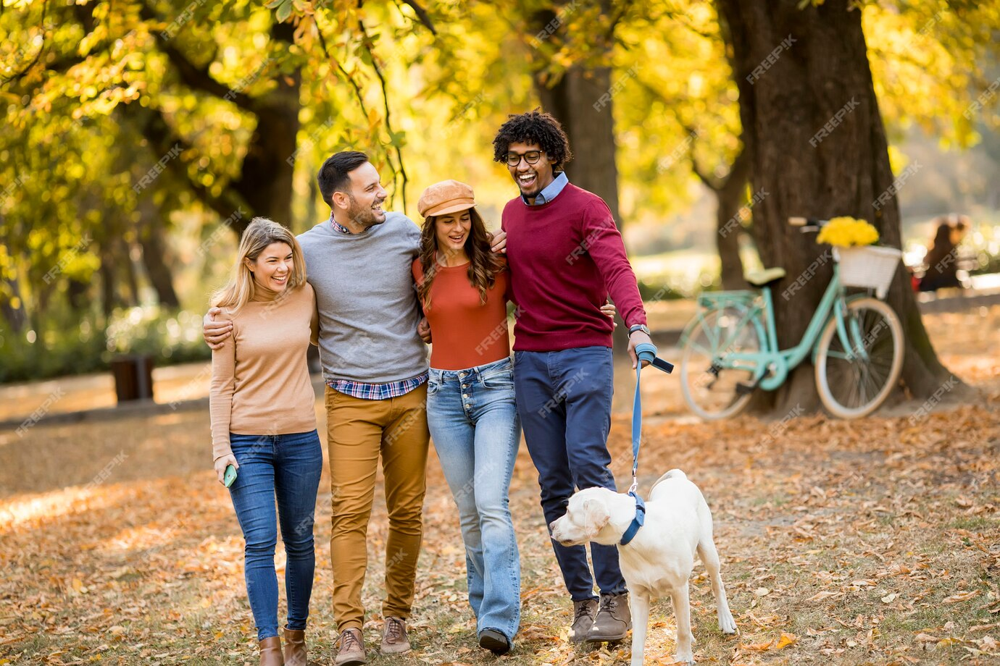

In [0]:
from PIL import Image
import IPython.display as visual
visual.display(Image.open("/tmp/IMAGEN_2.jpg"))

In [0]:
archivo = sdk.VisionSource(
  filename = "/tmp/IMAGEN_2.jpg"
)

In [0]:
servicio = sdk.ImageAnalyzer(credencialesDeAcceso, archivo, configuration)
resultado = servicio.analyze()

In [0]:
descripcion = resultado.caption.content

print(descripcion)

a group of people walking a dog


In [0]:
%fs cp dbfs:///mnt/azure/data/arial.ttf file:///tmp

res2: Boolean = true

In [0]:
imagenOriginal = Image.open("/tmp/IMAGEN_2.jpg")

In [0]:
from PIL import ImageFont

In [0]:
fuente = ImageFont.FreeTypeFont("/tmp/arial.ttf",size = 40)

In [0]:
from PIL import ImageDraw

In [0]:
dibujador = ImageDraw.Draw(imagenOriginal)

In [0]:
for objeto in resultado.objects:
  dibujador.rectangle(
    [
      objeto.bounding_box.x,
      objeto.bounding_box.y,
      objeto.bounding_box.x + objeto.bounding_box.w,
      objeto.bounding_box.y + objeto.bounding_box.h
    ],
    outline="red",
    width= 4
  )
  
  dibujador.text(
    [
      objeto.bounding_box.x,
      objeto.bounding_box.y - 40
    ],
    objeto.name,
    fill = "red",
    font = fuente
  )
  

In [0]:
imagenOriginal.save("/tmp/objetos_bounding_boxes.jpg")

In [0]:
imagenOriginal.close()

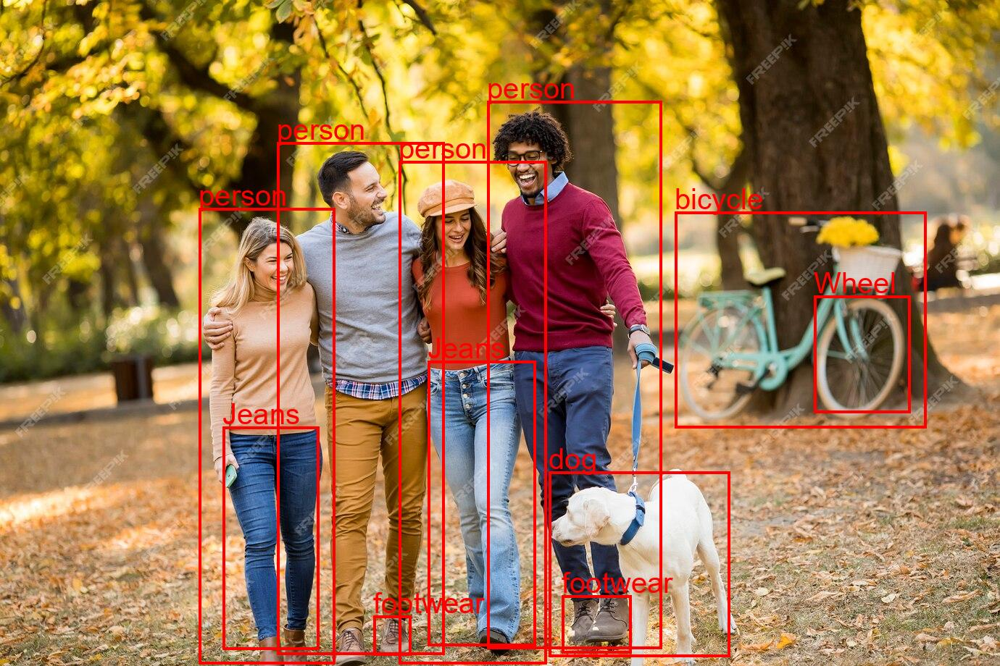

In [0]:
visual.display(Image.open("/tmp/objetos_bounding_boxes.jpg"))

In [0]:
%fs cp file:///tmp/objetos_bounding_boxes.jpg dbfs:///mnt/azure

res4: Boolean = true